## NOTE:
#### 1. K-means clustering perform by using 2-lakh samples.
#### 1. DBSCAN and Agglomerative clustering perform by using 20k samples.

## Import necessary libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
from sklearn.cluster import KMeans,AgglomerativeClustering,DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import *
import pickle
from tqdm import tqdm
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.sparse import *
from wordcloud import WordCloud
from operator import itemgetter
from os import path
from PIL import Image
import os
import requests
%matplotlib inline

## Load preprocessed data

In [3]:
#Functions to save objects for later use and retireve it
def savetofile(obj,filename):
    pickle.dump(obj,open(filename+".pkl","wb"))
def openfromfile(filename):
    temp = pickle.load(open(filename+".pkl","rb"))
    return temp

#DATA FOR K-MEANS
X=openfromfile('X')

count_vect =openfromfile('count_vect')
X_bigram = openfromfile('X_bigram')

tf_idf_vect =openfromfile('tf_idf_vect')
X_tfidf =openfromfile('X_tfidf')

avg_sent_vectors=openfromfile('avg_sent_vectors')
tfidf_sent_vectors=openfromfile('tfidf_sent_vectors')


#DATA FOR AGGLOMERATIVE AND DBSCAN
X_agg=openfromfile('X_agg')

avg_sent_vectors_agg=openfromfile('avg_sent_vectors_agg')
tfidf_sent_vectors_agg=openfromfile('tfidf_sent_vectors_agg')



In [4]:
print('No. of points used for Aglomerative and DBSCAN: ',len(avg_sent_vectors_agg))
print('No. of points used for K-means: ',len(avg_sent_vectors))

No. of points used for Aglomerative and DBSCAN:  19354
No. of points used for K-means:  160176


## Standardizing data

In [5]:
def std_data(data,mean):
    scaler=StandardScaler(with_mean=mean)
    std_data=scaler.fit_transform(data)
    return std_data

# Clustering:

### Function for K-Means hyperparameter tunning using elbow method :

In [6]:
def clustering_model(data,params,vect):
    '''hyperparam tunning and draw elbow curve'''
    inertia_value=[]
    for k in tqdm(params['clusters']):
        model=KMeans(n_clusters=k,init='k-means++',n_jobs=-1)
        model.fit(data)
        inertia_value.append(model.inertia_)
    plt.figure(1,figsize=(10,6))
    plt.plot(params['clusters'],inertia_value)
    plt.title('ELBOW METHOD %s(OPTIMAL HYPERPARAM)'%vect)
    plt.xlabel('K(No. of clusters): Hyperparam')
    plt.ylabel('Inertia(Sum of intra cluster distance)')
    plt.grid(True)
    plt.show()
        

### Function for labeling reviews and  visualizing no. of reviews per cluster  :

In [7]:
def review_labelling(data,all_Reviews,params,vect,algo):
    if algo=='kmeans':
        model=KMeans(n_clusters=params,precompute_distances=True,init='k-means++',n_jobs=-1)
    elif algo=='agglomerative':
        model=AgglomerativeClustering(n_clusters=params)
    elif algo=='dbscan':
        model=DBSCAN(eps=params,min_samples=200 , n_jobs=-1)
        
    model.fit(data)
    labels=model.labels_
    cluster_label=np.c_[ all_Reviews, labels ]
    cluster_label_df=pd.DataFrame(cluster_label,columns=['review','label'])
    print(cluster_label_df['label'].value_counts())
    list_samples=[]
    g=cluster_label_df.groupby(['label'])
    for key in g.groups:
        #AS DBSCAN GIVE -1 LABEL TO NOISY POINT
        if key!= -1:
            list_samples.append(len(g.groups[key]))
    #BAR CHART 
    if len(list_samples)!=0:
        plt.figure(1,figsize=(10,6))
        sns.set(rc={'figure.figsize':(11.7,8.27)})
        plt.title("NO. of Reviews per cluster")
        # ADD BARS
        plt.bar(range(len(list_samples)), list_samples) #plt.bar(range(params), list_samples)  
        # ADD LABELS
        plt.xticks(range(len(list_samples)))
        plt.xlabel('No. of Cluster')
        plt.ylabel('No. of Reviews')
        plt.show()
    else:
        print('All points are declared as noisy points for eps=%.2f' %params)
    return model,cluster_label_df

### Function To draw wordcloud for Frequent words belongs to each cluster :

In [8]:
def wordcloud_each_cluster(optimal_cluster,cluster_label_df):
    corpus_cluster={}
    #PROPERTIES OF TITLE
    title_font = {'size':'20', 'color':'black'}
    if not os.path.isfile('mask-cloud.png'):
        url='http://www.shapecollage.com/shapes/mask-cloud.png'
        r=requests.get(url)
        with open('mask-cloud.png','wb') as f:
            f.write(r.content)
    #SHAPE WORDCLOUD ACCORDING TO MASKABLE IMAGE
    mask_image_path = path.dirname(__file__) if "__file__" in locals() else os.getcwd()
    mask = np.array(Image.open(path.join(mask_image_path, "mask-cloud.png")))

    for i in range(optimal_cluster):
        #INITIALIZE WORDCLOUD OBJECT
        wordcloud = WordCloud(max_font_size=120,\
                              colormap='winter',\
                              max_words=100,\
                              collocations=False,
                              relative_scaling=1.0,
                              mask=mask,\
                              background_color='white',\
                              contour_width=2,\
                              contour_color='royalblue')
        #PICK REVIEWS BELONGS TO EACH CLUSTER
        cluster_reviews=cluster_label_df.loc[cluster_label_df['label']==i,['review']]
        #MERGE ALL REVIEWS BELONGS TO EACH CLUSTER INTO A SINGLE STRING
        corpus_cluster[i]= ' '.join(list(cluster_reviews['review']))
        #CREATE CORPUS OF WORDS FOR EACH CLUSTER
        word_token=wordcloud.process_text(corpus_cluster[i])
        #GENERATE WORDCLOUD ACCORDING TO WORD FREQUENCY 
        wordcloud.generate_from_frequencies(word_token)
        plt.figure(1,figsize=(14,13))
        plt.title("FREQUENT WORDS BELONGS TO CLUSTER-%d"%i, **title_font )
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.show()

## Initialization of common objects required for all vectorizer

In [9]:

#VECTORIZER USED
vect=['BOW','TFIDF','AVG-W2V','TFIDF-W2V']
#ALGORITHM USED
algo=['kmeans','agglomerative','dbscan']
#RANGE OF HYPERPARAM
params={'clusters':[z for z in range(1,10,1)]}


# [1] K-Means Clustering

## [1.1] Applying K-Means Clustering on BOW,<font color='red'> SET 1</font>

### [1.1.1] Hyperparam Tunning using Elbow Method<font color='red'> SET 1</font>

100%|██████████| 9/9 [09:41<00:00, 65.37s/it]


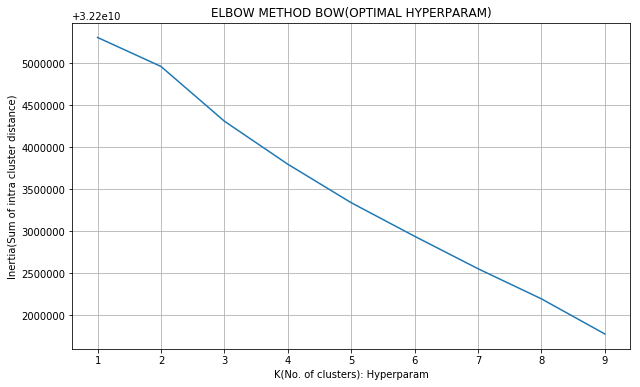

CPU times: user 16min 14s, sys: 32min 33s, total: 48min 48s
Wall time: 9min 41s


In [11]:
data=std_data(X_bigram,mean=False)
%time clustering_model(data,params,vect[0])

### Observation:
1. from the above plot we observe that after k=3, inertia reduces gradually so we choose k=3 as our knee point 

### [1.1.2] Review labelling <font color='red'> SET 1</font>

0    160148
1        28
Name: label, dtype: int64


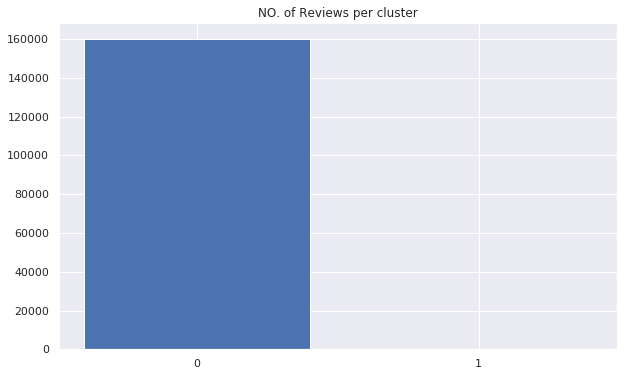

In [17]:
optimal_cluster=2
model,cluster_label_df=review_labelling(data,X,optimal_cluster,vect[0],algo[0])

### [1.1.3] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

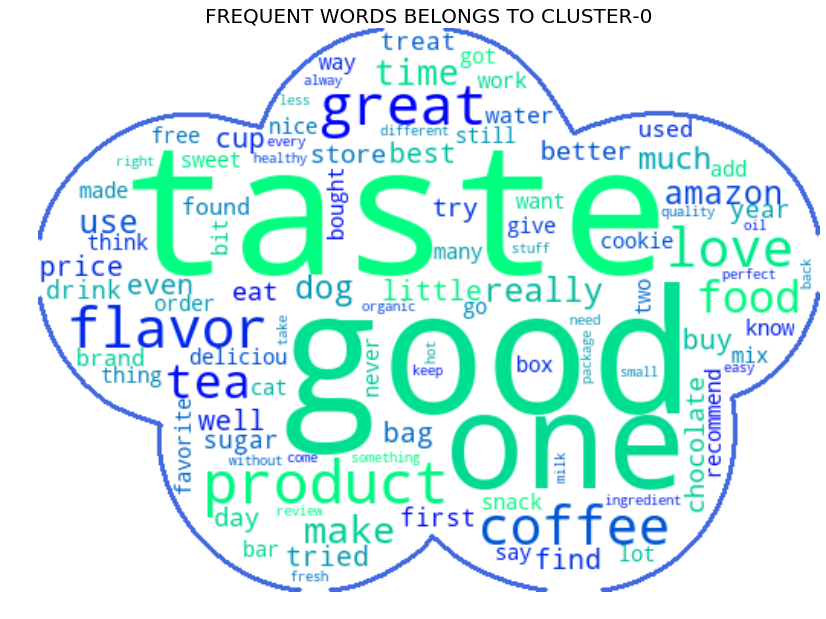

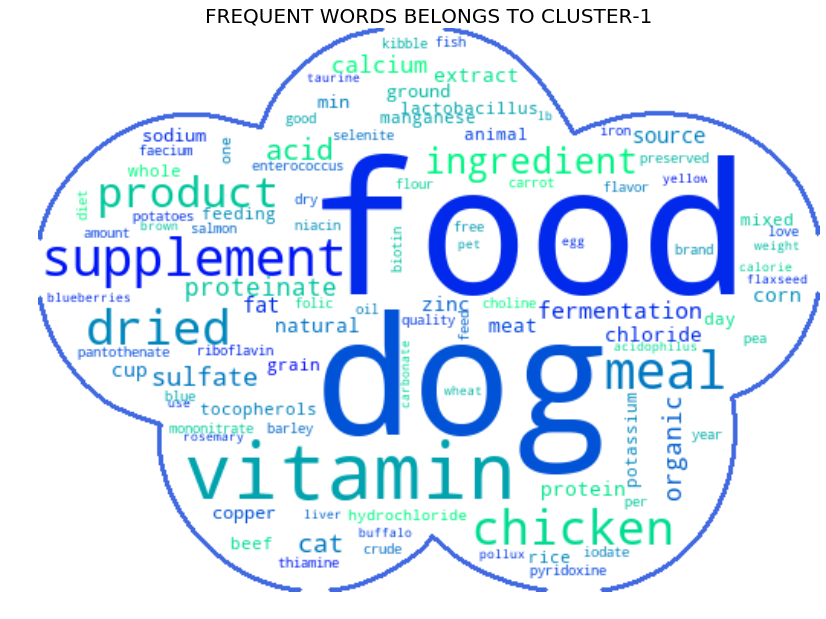

In [21]:
wordcloud_each_cluster(optimal_cluster,cluster_label_df)

### Observation:
1. From the above wordclouds we observe that:

    a. cluster-0 contains words which shows some positiveness(positive review)(ex. great, love, good, best etc) 
    
    b. cluster-1 contains words related to chemical compounds(ex.calcium,sulfate,pyridoxine etc) and supplement(ex. vitamin, proteinate, grain, protein etc) products 
    

## [1.2] Applying K-Means Clustering on TFIDF,<font color='red'> SET 2</font>

### [1.2.1] Hyperparam Tunning<font color='red'> SET 2</font>

100%|██████████| 9/9 [09:43<00:00, 65.22s/it]


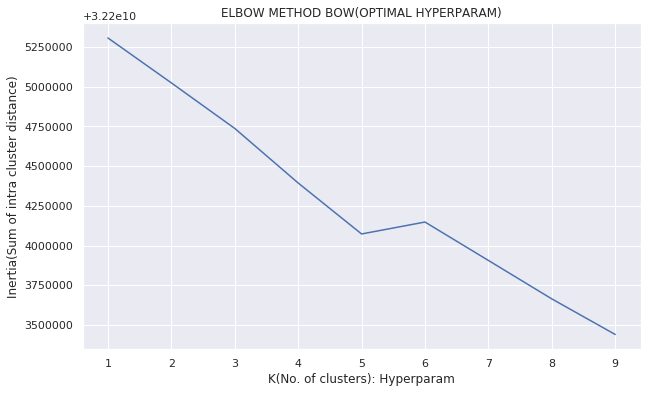

CPU times: user 16min, sys: 30min 59s, total: 46min 59s
Wall time: 9min 43s


In [23]:
data=std_data(X_tfidf,mean=False)
%time clustering_model(data,params,vect[1])

### Observation:
1. from the above plot we observe that after k=5, inertia reduces gradually so we choose k=5 as our knee point 

### [1.2.2] Review labelling <font color='red'> SET 2</font>

2    160051
1        70
4        35
3        13
0         7
Name: label, dtype: int64


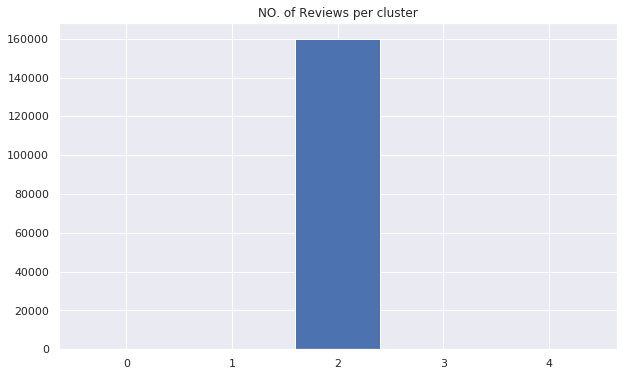

In [24]:
optimal_cluster=5
model,cluster_label_df=review_labelling(data,X,optimal_cluster,vect[0],algo[0])

### [1.2.3] Wordclouds of clusters obtained after applying k-means on TFIDF<font color='red'> SET 2</font>

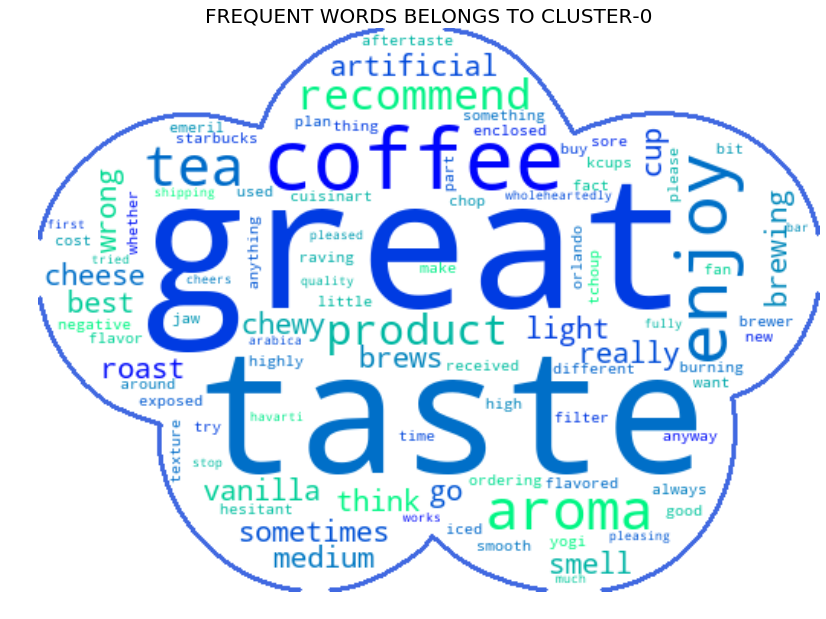

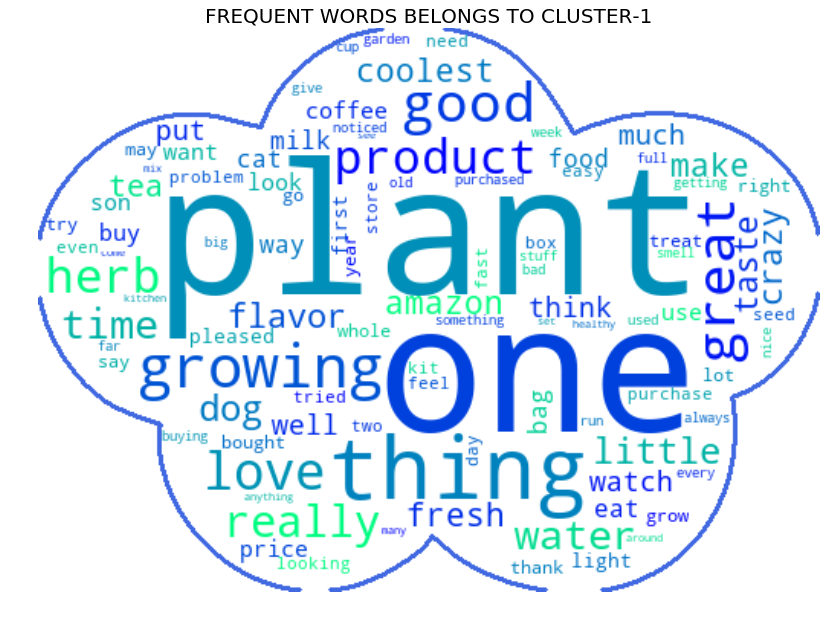

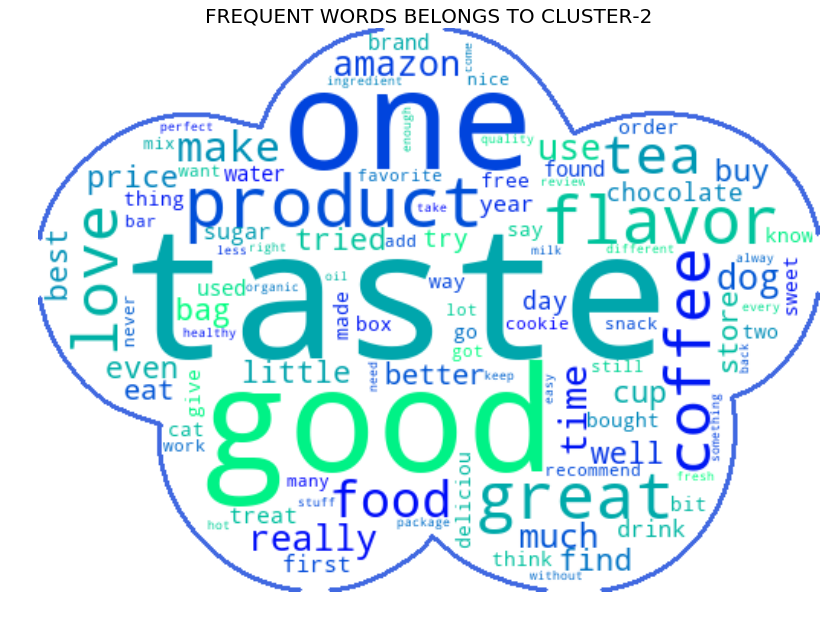

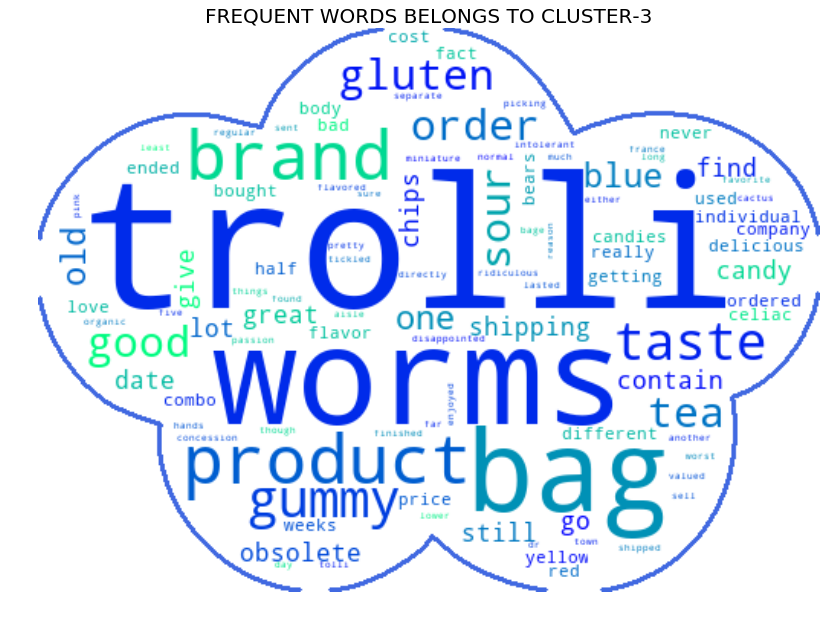

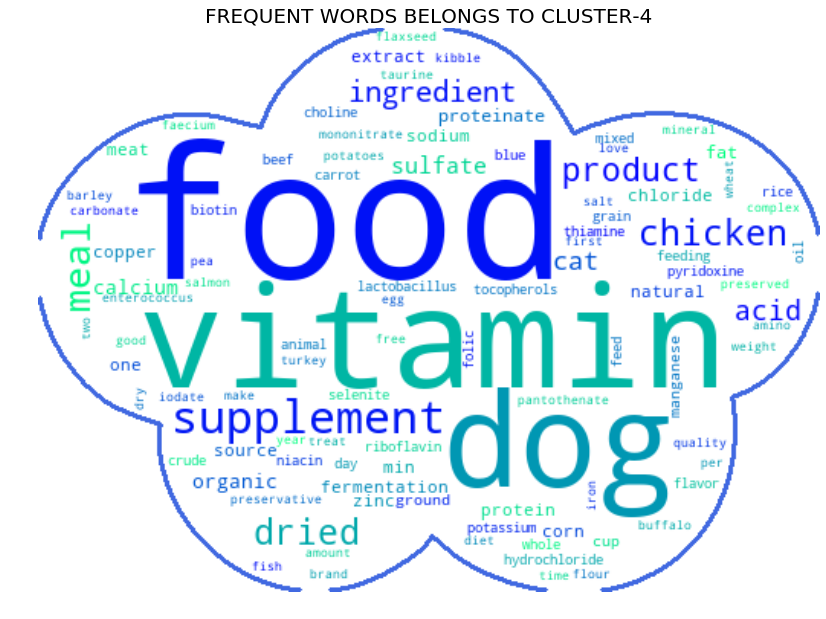

In [30]:
wordcloud_each_cluster(optimal_cluster,cluster_label_df)

### Observation:
1. From the above wordclouds we observe that:

    a. cluster-4 contains words related to chemical compounds(ex.calcium,sulfate,pyridoxine etc) and supplement(ex. vitamin, proteinate, grain, protein etc) products
    
    b. cluster-2 contains words which shows some positiveness(positive review)(ex. great, love, good, best etc)

## [1.3] Applying K-Means Clustering on AVG W2V,<font color='red'> SET 3</font>

### [1.3.1] Hyperparam Tunning<font color='red'> SET 3</font>

100%|███████████████████████████████████████████████████████████████████████████████████| 9/9 [15:09<00:00, 128.62s/it]


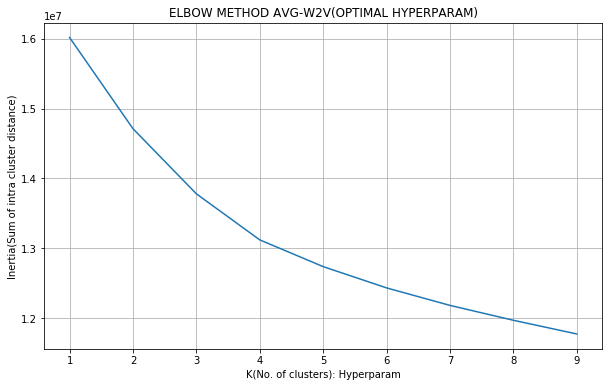

Wall time: 15min 10s


In [10]:
params={'clusters':[z for z in range(1,10,1)]}
data=std_data(avg_sent_vectors,mean=True)
%time clustering_model(data,params,vect[2])

### Observation:
1. from the above plot we observe that after k=4, inertia reduces gradually so we choose k=4 as our knee point 

### [1.3.2] Review labelling <font color='red'> SET 3</font>

1    65469
3    41676
0    26831
2    26200
Name: label, dtype: int64


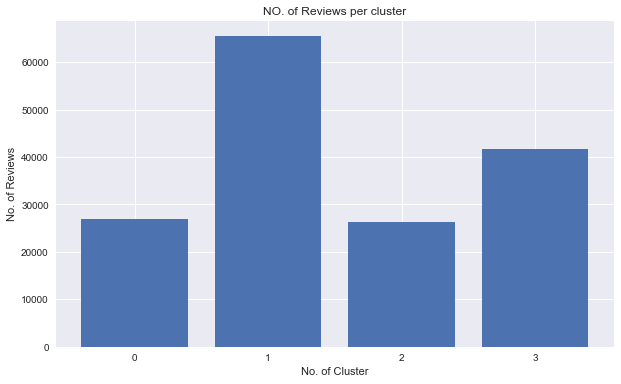

In [11]:
optimal_cluster=4
model,cluster_label_df=review_labelling(data,X,optimal_cluster,vect[2],algo[0])

### [1.3.3] Wordclouds of clusters obtained after applying k-means on AVG W2V<font color='red'> SET 3</font>

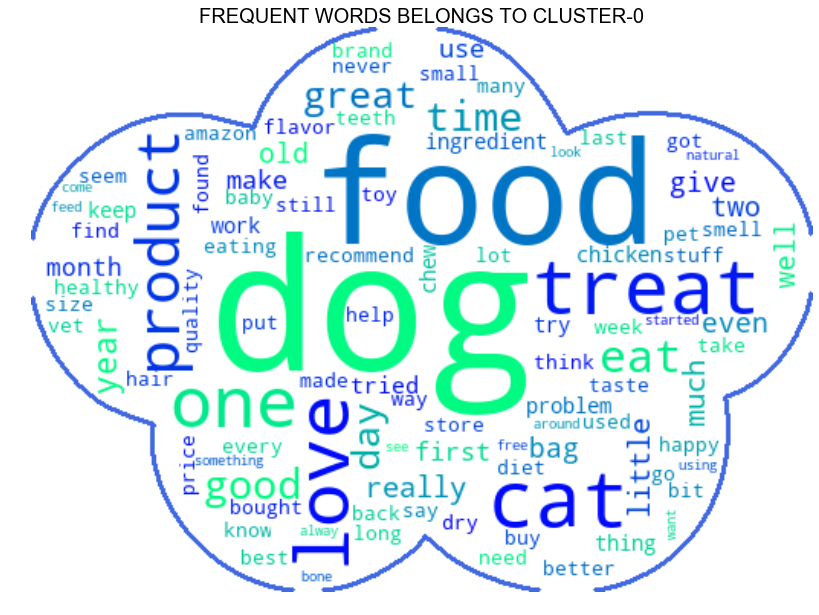

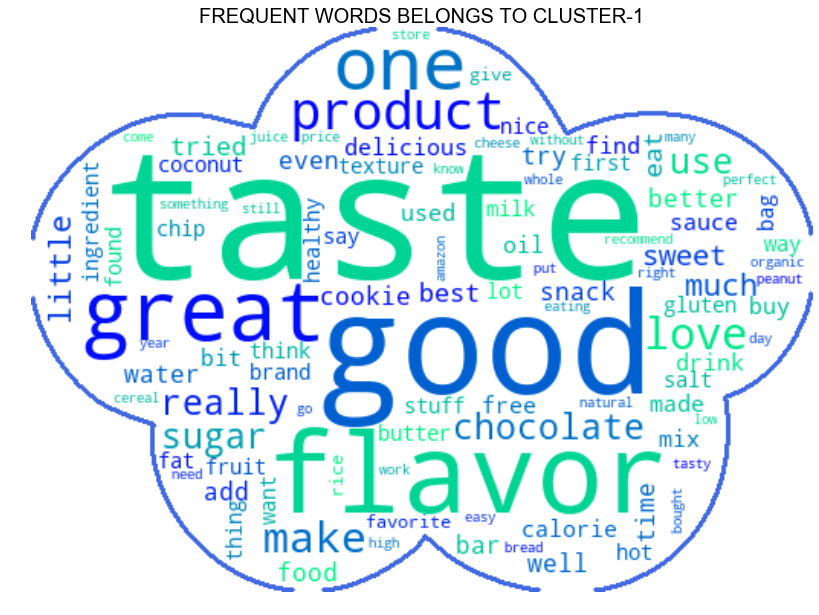

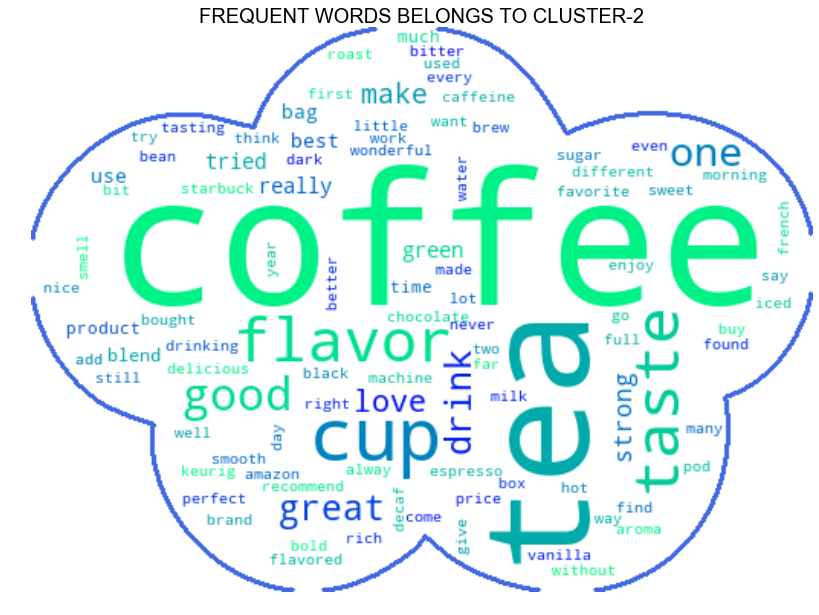

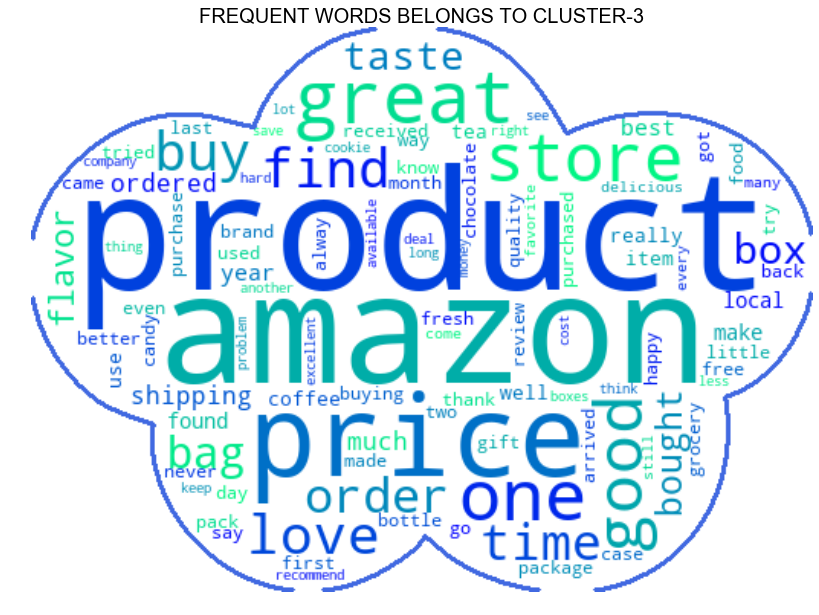

In [12]:
wordcloud_each_cluster(optimal_cluster,cluster_label_df)

### Observation:
1. From the above wordclouds we cant say anything about cluster because all the clusters are having mixup of words.

### [1.4] Applying K-Means Clustering on TFIDF W2V,<font color='red'> SET 4</font>

### [1.4.1] Hyperparam Tunning<font color='red'> SET 4</font>

100%|███████████████████████████████████████████████████████████████████████████████████| 9/9 [17:43<00:00, 145.34s/it]


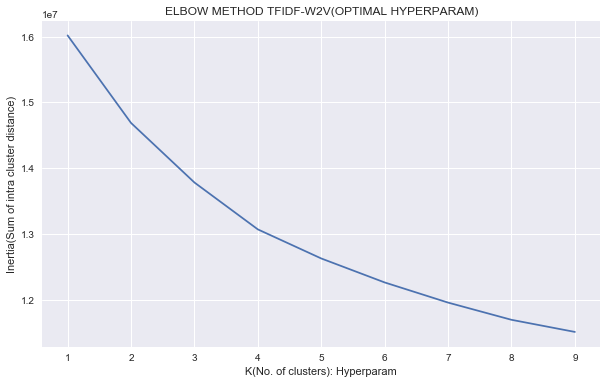

Wall time: 17min 44s


In [13]:
data=std_data(tfidf_sent_vectors,mean=True)
%time clustering_model(data,params,vect[3])

### Observation:
1. from the above plot we observe that after k=4, inertia reduces gradually so we choose k=4 as our knee point 

### [1.4.2] Review labelling <font color='red'> SET 4</font>

0    66887
3    49716
2    23635
1    19938
Name: label, dtype: int64


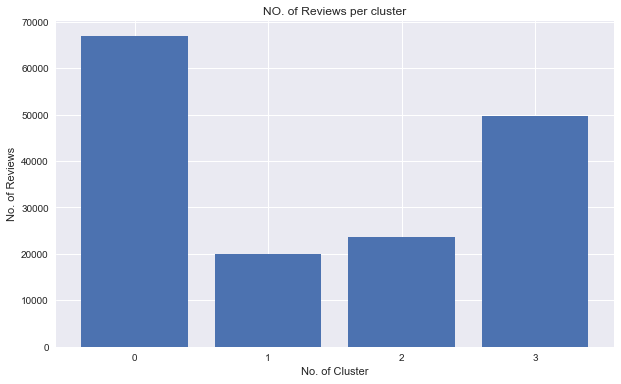

In [14]:
optimal_cluster=4
model,cluster_label_df=review_labelling(data,X,optimal_cluster,vect[3],algo[0])

### [1.4.3] Wordclouds of clusters obtained after applying k-means on TFIDF W2V<font color='red'> SET 4</font>

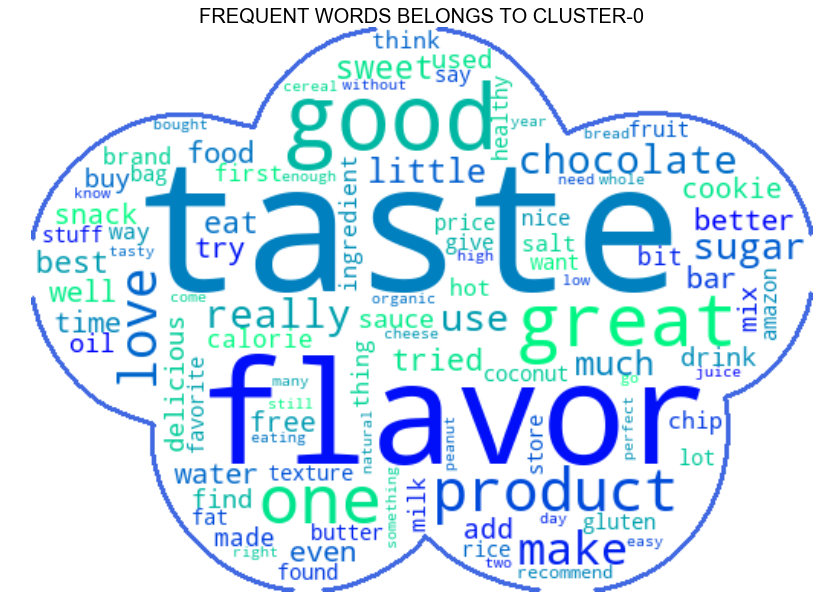

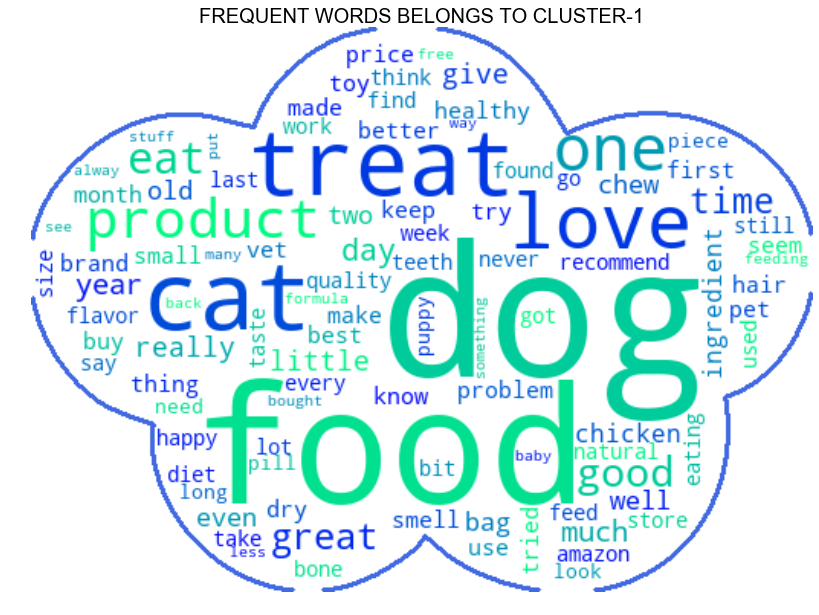

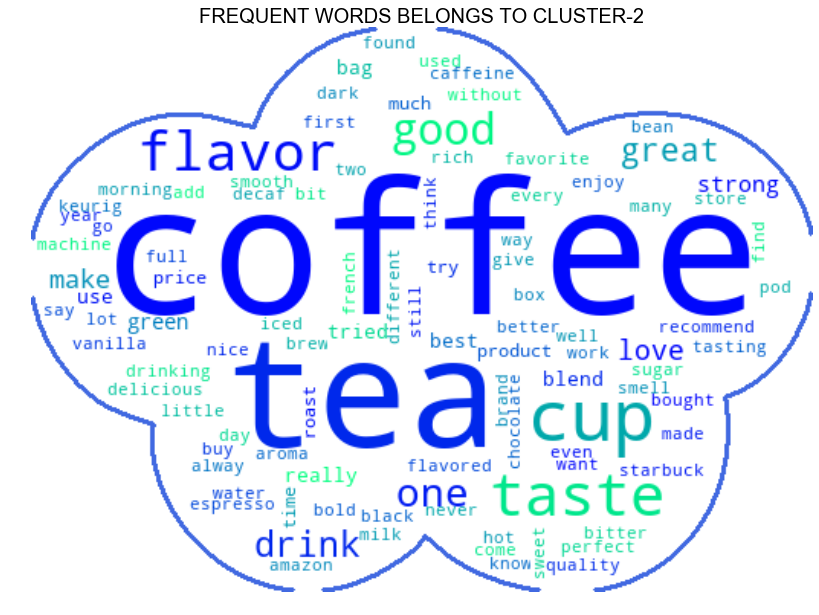

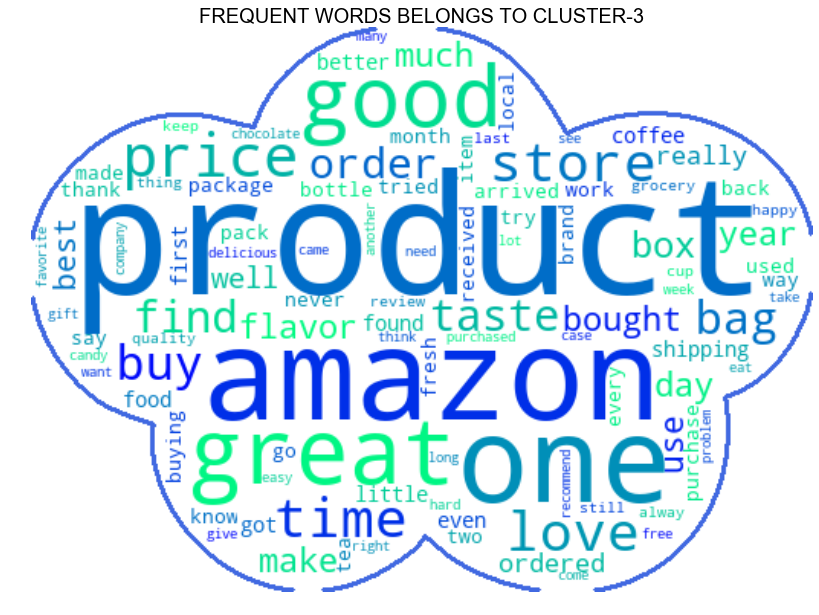

In [15]:
wordcloud_each_cluster(optimal_cluster,cluster_label_df)

### Observation:
1. From the above wordclouds we cant say anything about cluster because all the clusters are having mixup of words.

# ---------------------------------------------------------------------------------------------------------------

## [2] Agglomerative Clustering

In [14]:
no_of_cluster=[2,5]

### [2.1] Applying Agglomerative Clustering on AVG W2V,<font color='red'> SET 3</font>

### [i] Agglomerative clustering with 2-clusters :

0    15406
1     3948
Name: label, dtype: int64


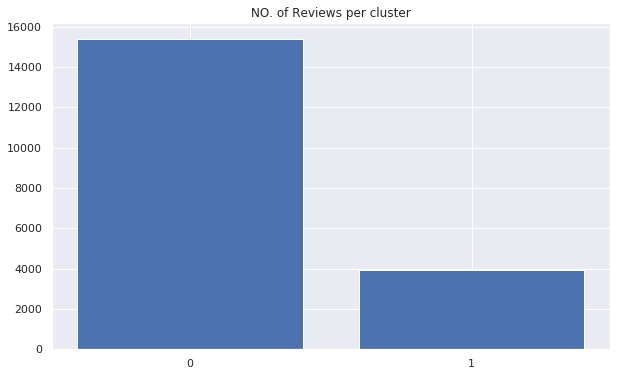

In [11]:
data=std_data(avg_sent_vectors_agg,mean=True)
model,cluster_label_df=review_labelling(data=data,all_Reviews=X_agg,params=no_of_cluster[0],vect=vect[2],algo=algo[1])

### Wordclouds of clusters obtained after applying Agglomerative Clustering on AVG W2V

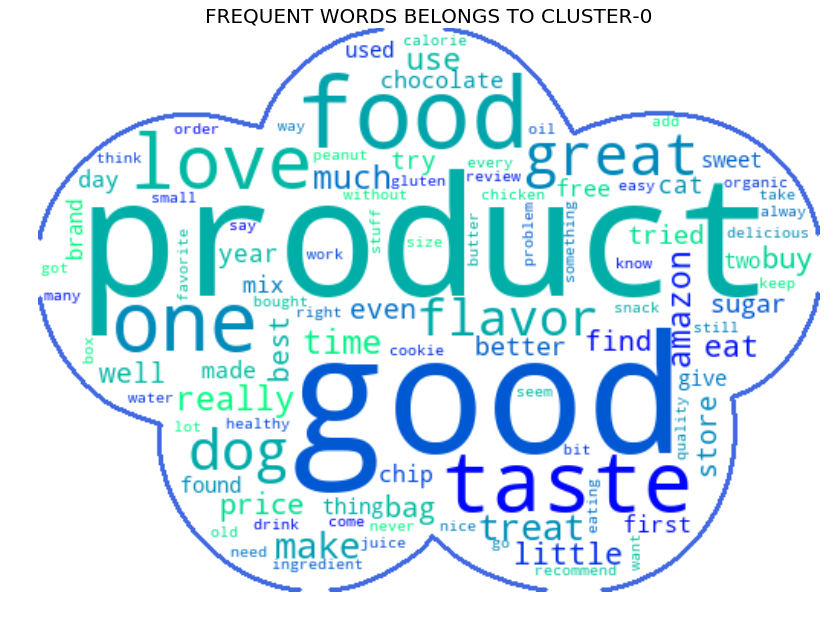

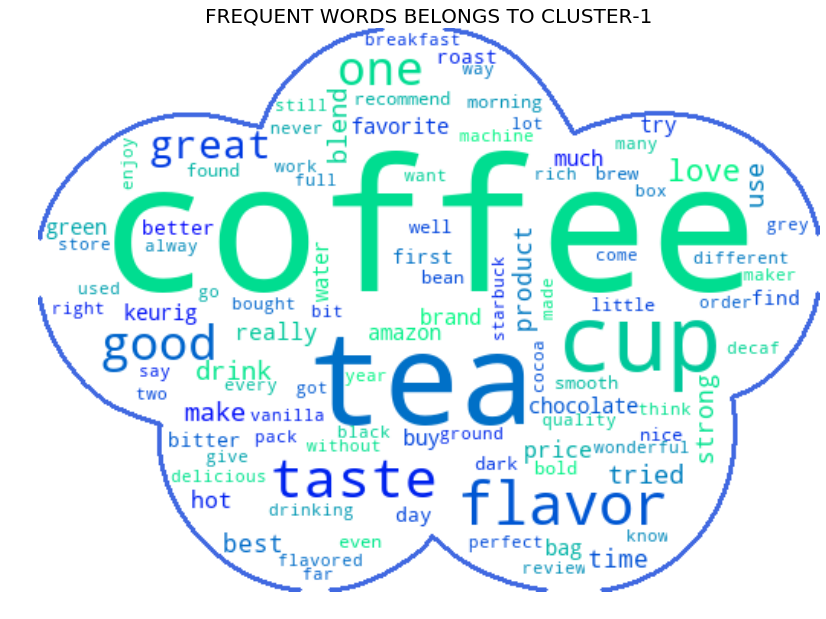

In [12]:
wordcloud_each_cluster(no_of_cluster[0],cluster_label_df)

### Observation:
1. From the above wordclouds we cant say anything about cluster because all the clusters are having mixup of words.

### [ii] Agglomerative clustering with 5-clusters :

3    6598
0    4876
1    3948
2    2809
4    1123
Name: label, dtype: int64


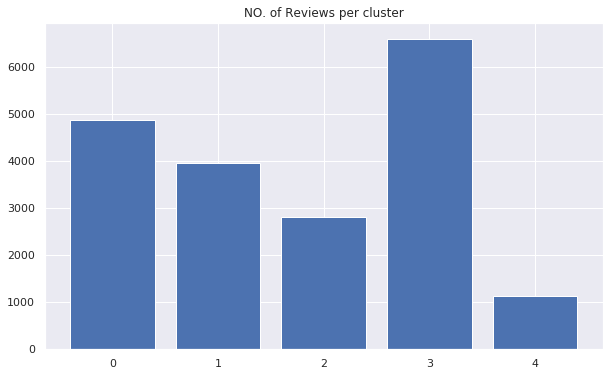

In [15]:
data=std_data(avg_sent_vectors_agg,mean=True)
model,cluster_label_df=review_labelling(data=data,all_Reviews=X_agg,params=no_of_cluster[1],vect=vect[2],algo=algo[1])

### Wordclouds of clusters obtained after applying Agglomerative Clustering on AVG W2V:

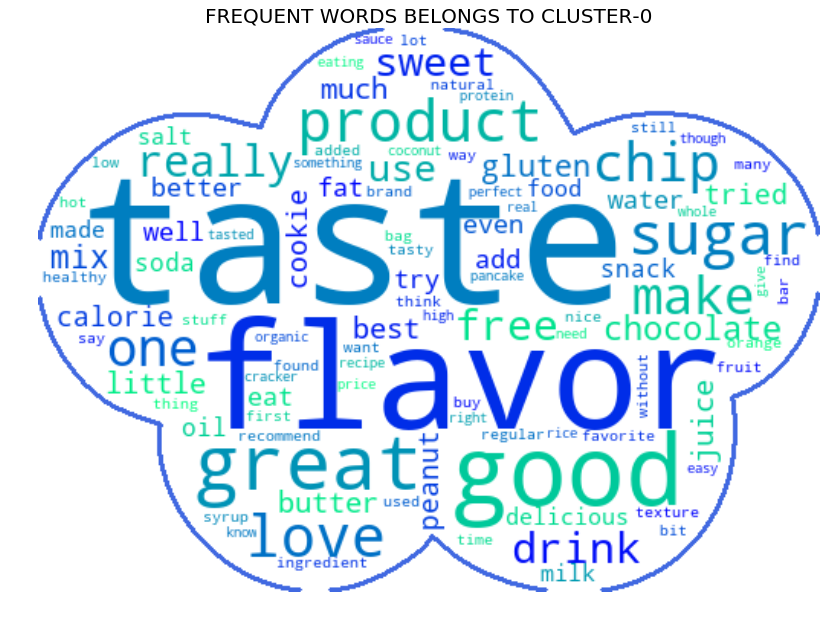

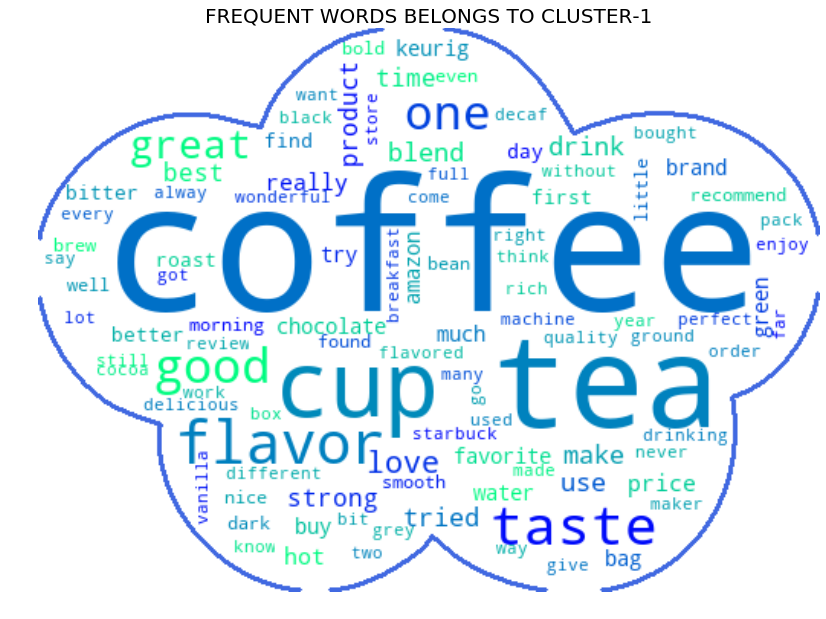

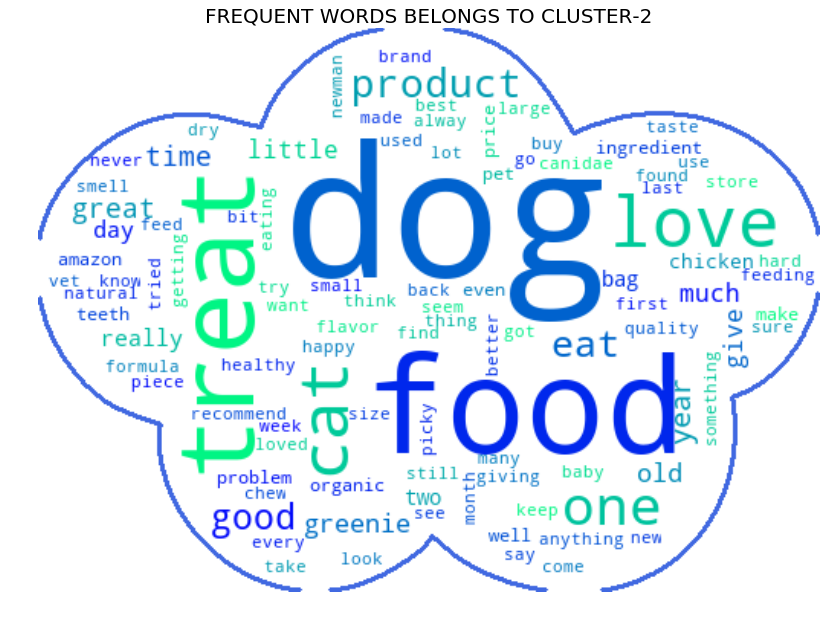

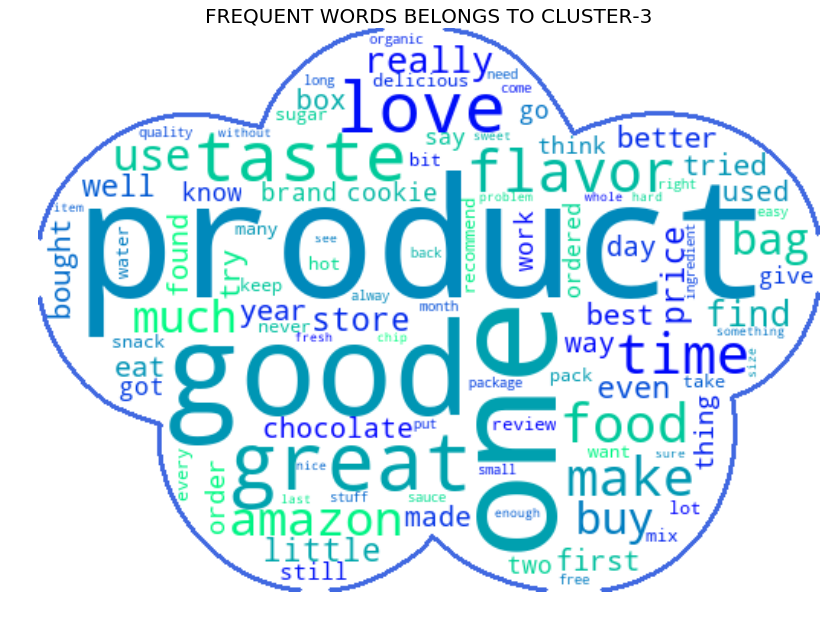

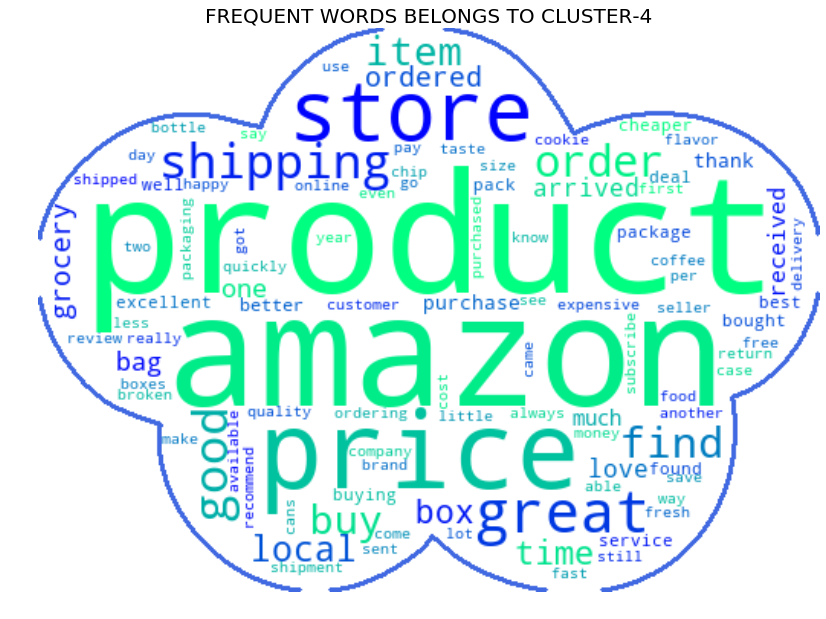

In [16]:
wordcloud_each_cluster(no_of_cluster[1],cluster_label_df)

### Observation:
1. From the above wordclouds we cant say anything about cluster because all the clusters are having mixup of words.

### [2.2] Applying Agglomerative Clustering on TFIDF W2V,<font color='red'> SET 4</font>

### [i] Agglomerative clustering with 2-clusters :

0    16899
1     2455
Name: label, dtype: int64


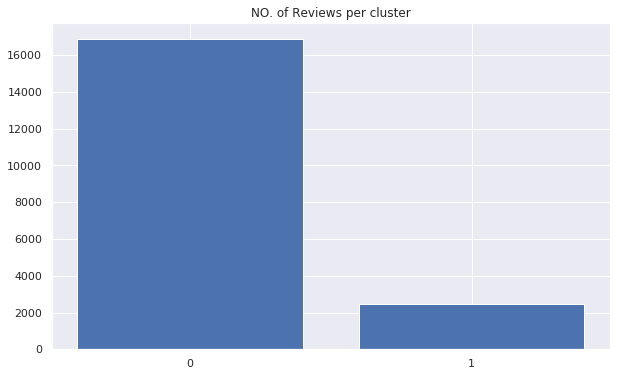

In [32]:
data=std_data(tfidf_sent_vectors_agg,mean=True)
model,cluster_label_df=review_labelling(data=data,all_Reviews=X_agg,params=no_of_cluster[0],vect=vect[3],algo=algo[1])

### Wordclouds of clusters obtained after applying Agglomerative Clustering on TFIDF W2V:

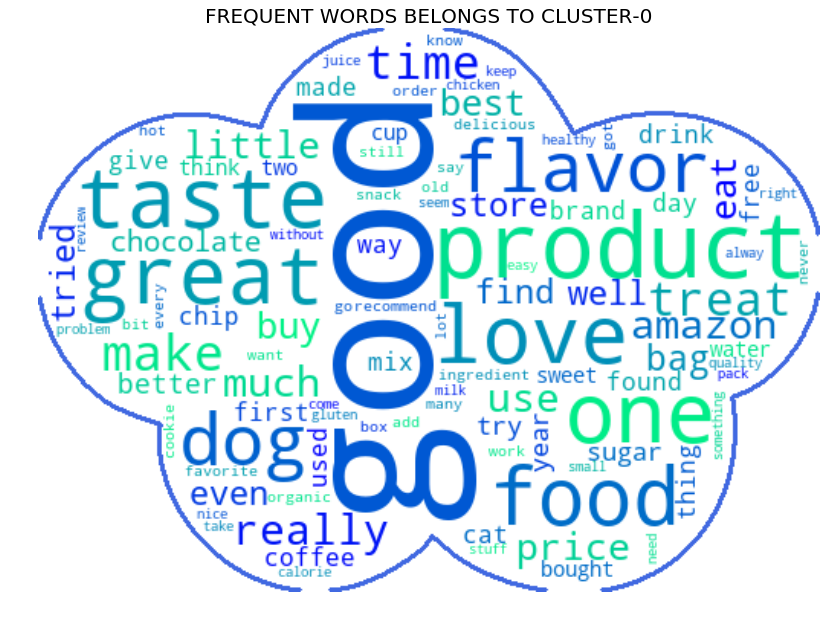

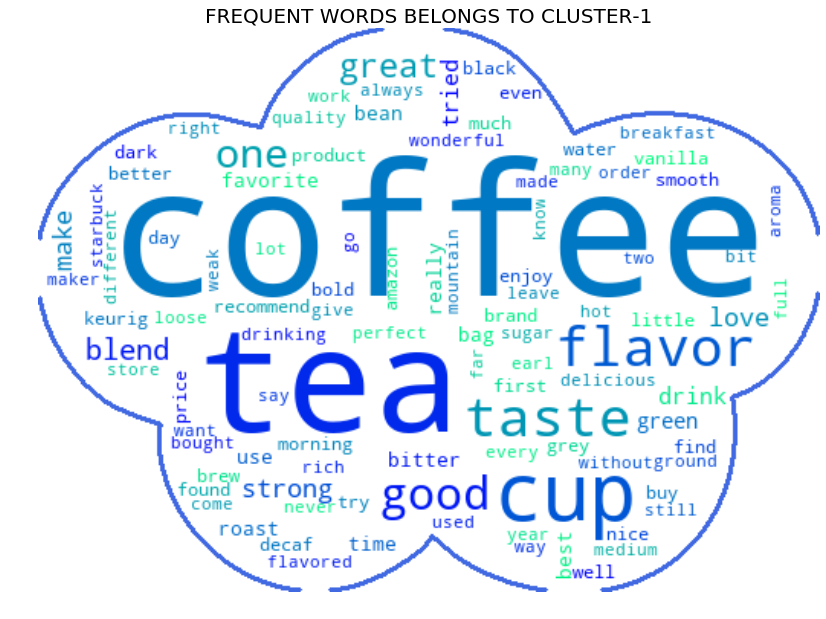

In [33]:
wordcloud_each_cluster(no_of_cluster[0],cluster_label_df)

### Observation:
1. From the above wordclouds we observe that cluster-0 contain mostly positive words(ex great, love, good etc).

### [ii] Agglomerative clustering with 5-clusters :

0    7455
4    4067
3    3310
1    2455
2    2067
Name: label, dtype: int64


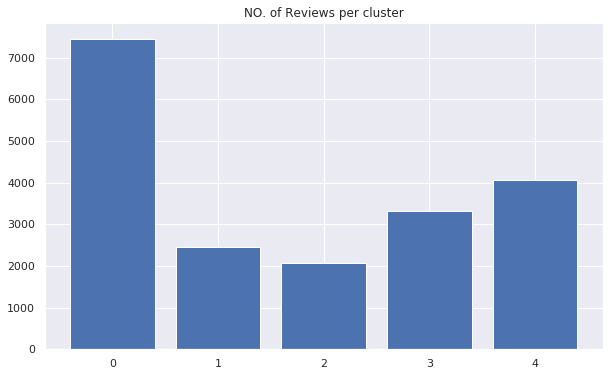

In [19]:
model,cluster_label_df=review_labelling(data=data,all_Reviews=X_agg,params=no_of_cluster[1],vect=vect[3],algo=algo[1])

### Wordclouds of clusters obtained after applying Agglomerative Clustering on TFIDF W2V:

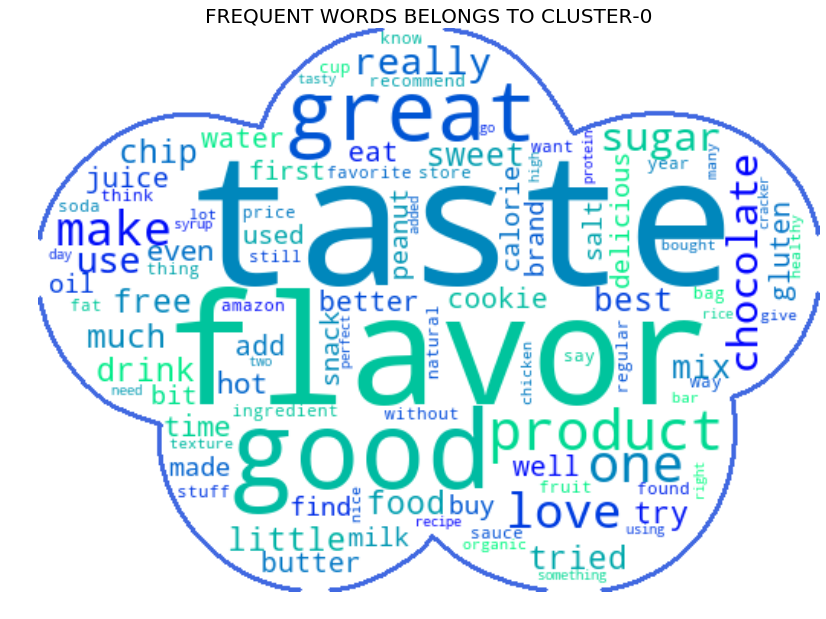

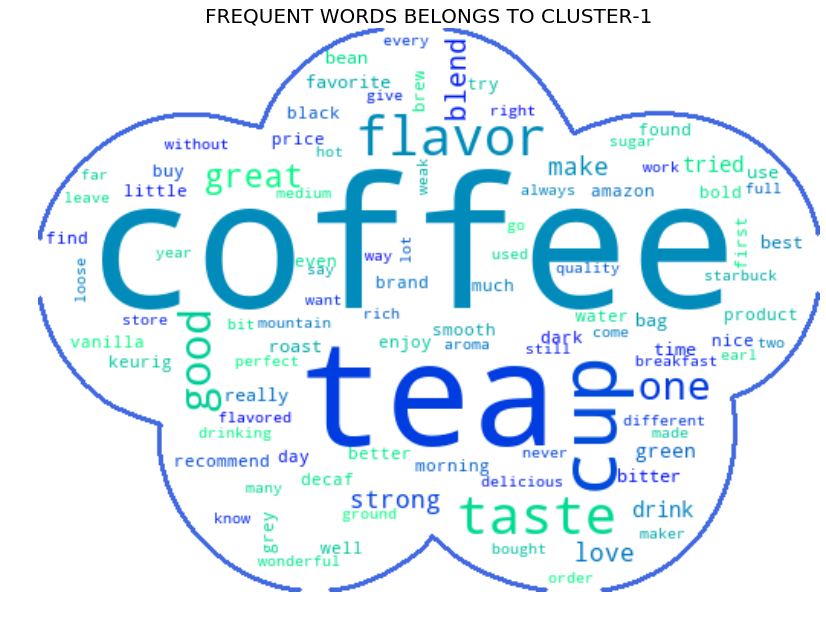

In [20]:
wordcloud_each_cluster(no_of_cluster[1],cluster_label_df)

### Observation:
1. From the above wordclouds we cant say anything about cluster because all the clusters are having mixup of words.

## [3] DBSCAN Clustering

In [34]:
eps=[.5,5,10]

### [3.1] Applying DBSCAN on AVG W2V,<font color='red'> SET 3</font>

### [i] DBSCAN clustering with eps=.5 :

-1    12529
 0     6825
Name: label, dtype: int64


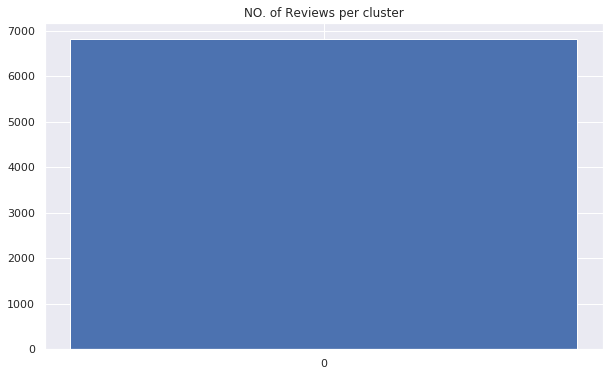

In [30]:
data=std_data(avg_sent_vectors_agg,mean=True)
model,cluster_label_df=review_labelling(data=data,all_Reviews=X_agg,params=eps[0],vect=vect[2],algo=algo[2])

### Observation:
1. all the reviews are grouped into one cluster.
2. 12259 points are declared as noisy points.

### Wordclouds of clusters obtained after applying DBSCAN on AVG W2V

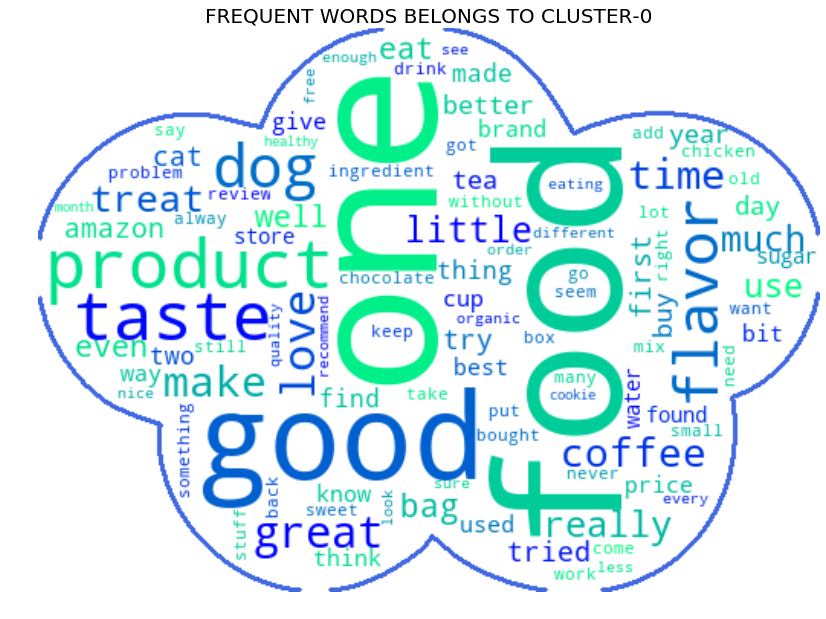

In [31]:
n_clusters=1
wordcloud_each_cluster(n_clusters,cluster_label_df)

### Observation:
1. From the above wordclouds we cant say anything about cluster because all the clusters are having mixup of words.

### [ii] DBSCAN clustering with eps= 5 :

-1    12529
 0     6825
Name: label, dtype: int64


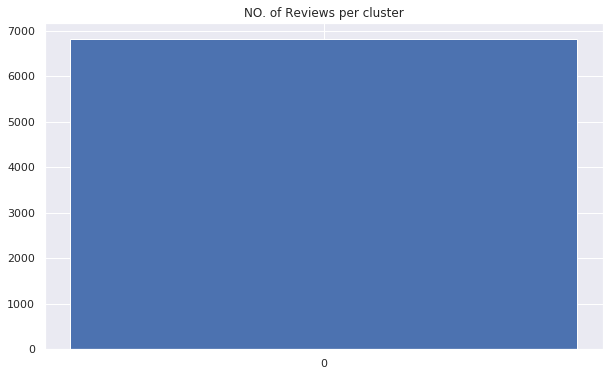

In [35]:
data=std_data(avg_sent_vectors_agg,mean=True)
model,cluster_label_df=review_labelling(data=data,all_Reviews=X_agg,params=eps[1],vect=vect[2],algo=algo[2])

### Observation:
1. all the reviews are grouped into one cluster.
2. 12259 points are declared as noisy points.

### Wordclouds of clusters obtained after applying DBSCAN on AVG W2V:

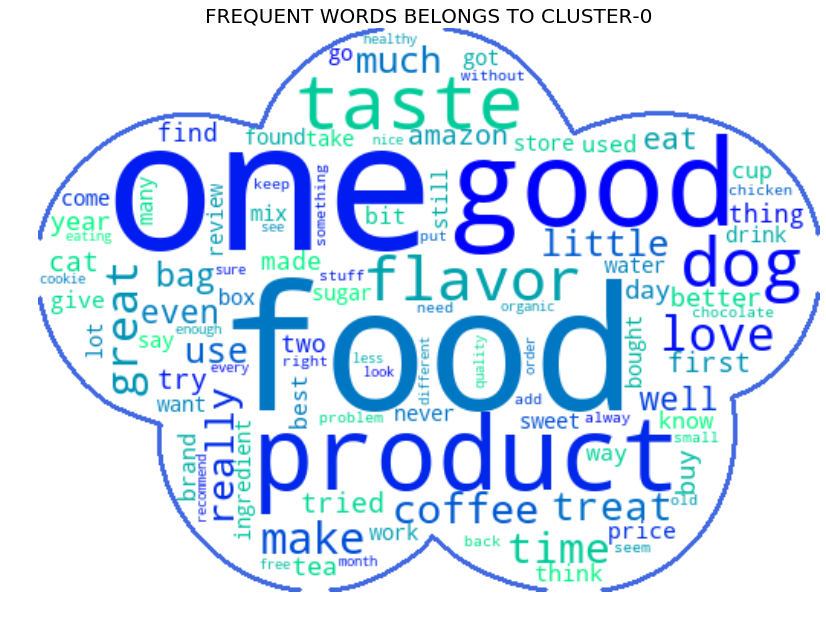

In [36]:
n_clusters=1
wordcloud_each_cluster(n_clusters,cluster_label_df)

### Observation:
1. From the above wordclouds we cant say anything about cluster because all the clusters are having mixup of words.

### [iii] DBSCAN clustering with eps= 10 :

 0    19219
-1      135
Name: label, dtype: int64


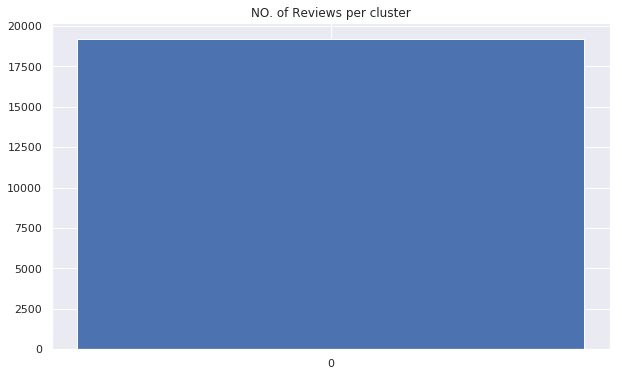

In [37]:
data=std_data(avg_sent_vectors_agg,mean=True)
model,cluster_label_df=review_labelling(data=data,all_Reviews=X_agg,params=eps[2],vect=vect[2],algo=algo[2])

### Observation:
1. all the reviews are grouped into one cluster.
2. 135 points are declared as noisy points.

### Wordclouds of clusters obtained after applying DBSCAN on AVG W2V:

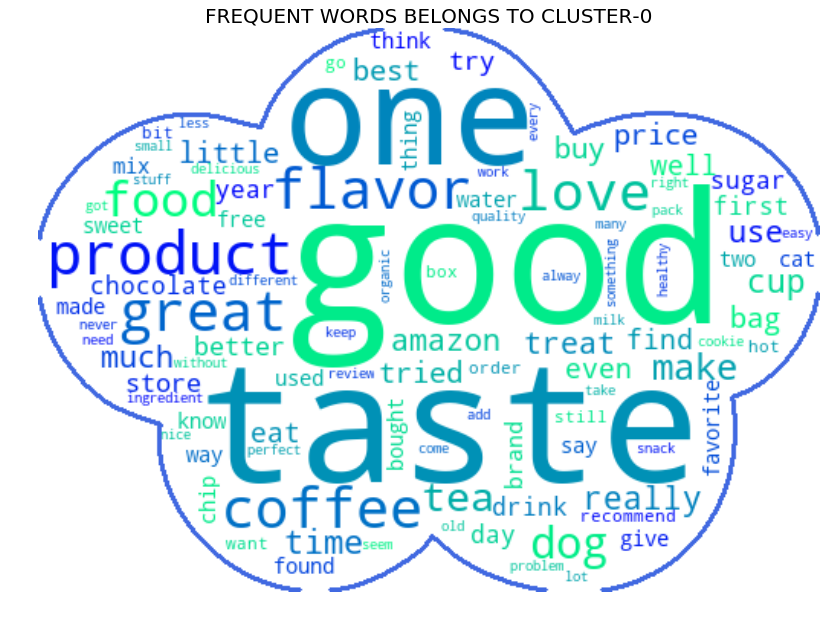

In [38]:
n_clusters=1
wordcloud_each_cluster(n_clusters,cluster_label_df)

### Observation:
1. From the above wordclouds we cant say anything about cluster because all the clusters are having mixup of words.

### [3.2] Applying DBSCAN on TFIDF W2V,<font color='red'> SET 4</font>

### [i] DBSCAN clustering with eps=.5 :

-1    19354
Name: label, dtype: int64


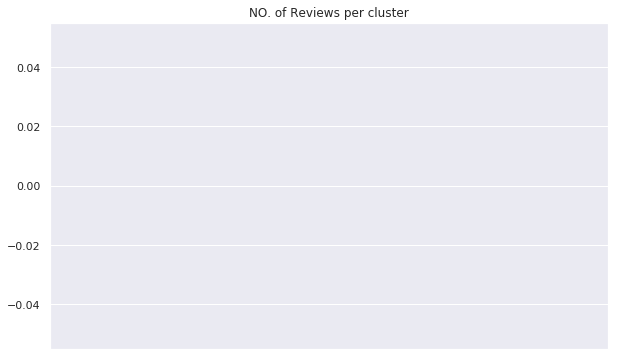

In [41]:
data=std_data(tfidf_sent_vectors_agg,mean=True)
model,cluster_label_df=review_labelling(data=data,all_Reviews=X_agg,params=eps[0],vect=vect[3],algo=algo[2])

### Observation:
1. all the reviews are declareded as noisy points whe we choose very small value of eps(i.e .5).

### Wordclouds of clusters obtained after applying DBSCAN on TFIDF W2V

In [43]:
n_clusters=0
wordcloud_each_cluster(n_clusters,cluster_label_df)

### [ii] DBSCAN clustering with eps=5 :

-1    9744
 0    9610
Name: label, dtype: int64


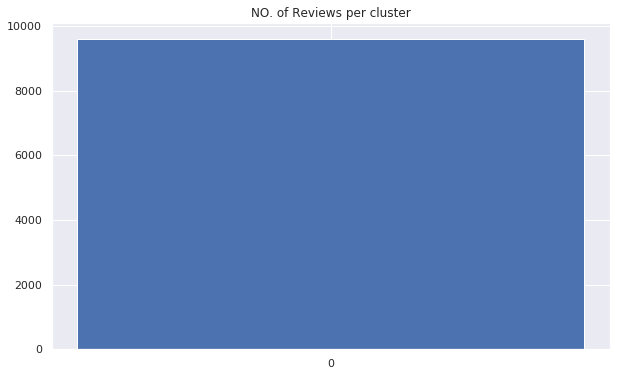

In [44]:
data=std_data(tfidf_sent_vectors_agg,mean=True)
model,cluster_label_df=review_labelling(data=data,all_Reviews=X_agg,params=eps[1],vect=vect[3],algo=algo[2])

### Observation:
1. all the reviews are grouped into one cluster.
2. 9744 points are declared as noisy points.

### Wordclouds of clusters obtained after applying DBSCAN on TFIDF W2V

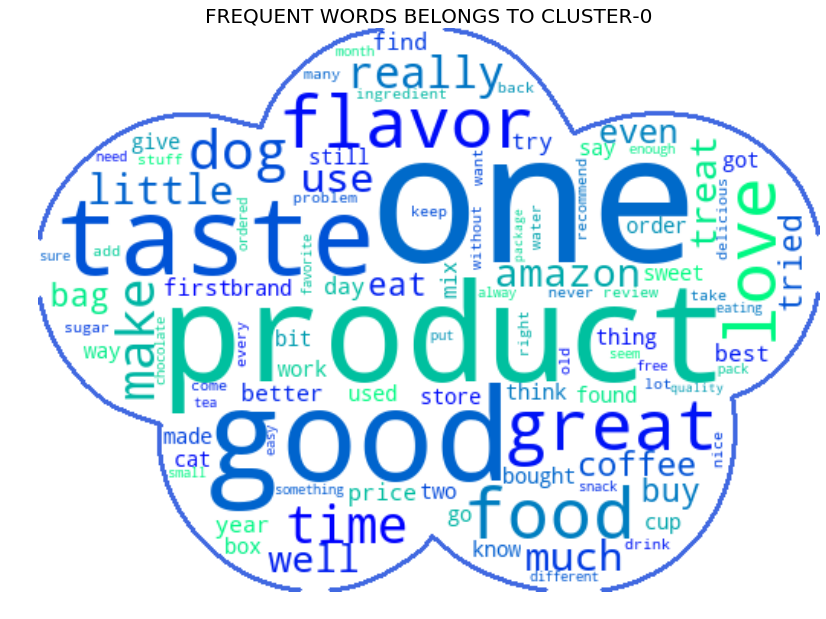

In [45]:
n_clusters=1
wordcloud_each_cluster(n_clusters,cluster_label_df)

### Observation:
1. From the above wordclouds we cant say anything about cluster because all the clusters are having mixup of words.

### [iii] DBSCAN clustering with eps=10 :

 0    19263
-1       91
Name: label, dtype: int64


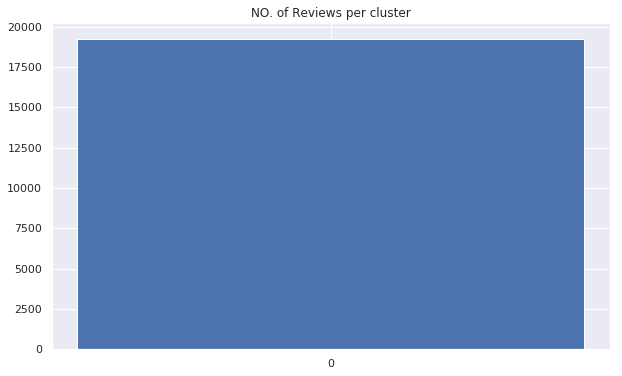

In [46]:
data=std_data(tfidf_sent_vectors_agg,mean=True)
model,cluster_label_df=review_labelling(data=data,all_Reviews=X_agg,params=eps[2],vect=vect[3],algo=algo[2])

### Observation:
1. all the reviews are grouped into one cluster.
2. 91 points are declared as noisy points.

### Wordclouds of clusters obtained after applying DBSCAN on TFIDF W2V

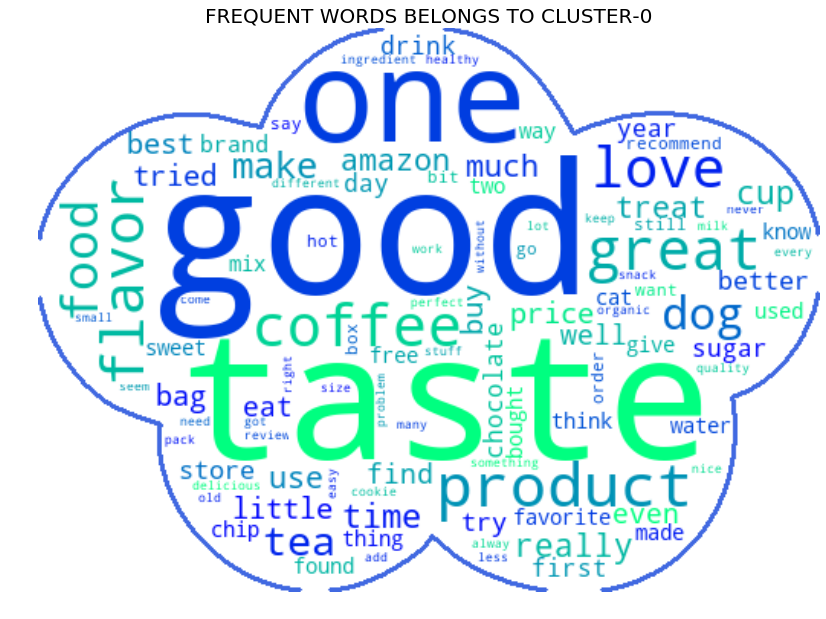

In [47]:
n_clusters=1
wordcloud_each_cluster(n_clusters,cluster_label_df)

### Observation:
1. From the above wordclouds we cant say anything about cluster because all the clusters are having mixup of words.

# [6] Conclusions

1. K-Means for BoW vectors shows good clustering results because in this technique we observe that our clusters are well separated one cluster contains positive words and the other one contains supplements and chemical compounds.